In [65]:
import sys
import os
import platform
import importlib
import glob
import calendar
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import cartopy
import cartopy.crs as ccrs
import warnings

import numpy as np
import pandas as pd
import netCDF4
from tqdm import tqdm
import json
import joblib
import re
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score
from bayes_opt import BayesianOptimization
import multiprocessing as mp

import cupy as cp # Cupy is used to handle data on GPU
import xgboost as xgb
from cuml.linear_model import ElasticNet as cuML_ElasticNet
import cuml
from cuml.ensemble import RandomForestRegressor as cuRF
from cuml.svm import SVR
import lightgbm as lgb
import torch
import tensorflow as tf
import keras
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Input, Dense, Dropout, BatchNormalization
from keras.callbacks import EarlyStopping, ReduceLROnPlateau #, LearningRateScheduler

base_FP = '/home/subin/data'
cpuserver_data_FP = '/home/subin/cpuserver_data'
print(base_FP)
print(cpuserver_data_FP)
sys.path.append(base_FP + '/python_modules')

import HydroAI.Data as hData
import HydroAI.ERA5_land as hERA5
import HydroAI.SMAP as hSMAP
import HydroAI.Grid as hGrid
import HydroAI.TC_like as hTCL
import develop_HydroAI.HydroAI.Plot as hPlot
import develop_HydroAI.HydroAI.Shallow_ML as hSML
import HydroAI.Land_Properties as hLP
import develop_HydroAI.HydroAI.HLS as hHLS

importlib.reload(hData);
importlib.reload(hERA5);
importlib.reload(hGrid);
importlib.reload(hSMAP);
importlib.reload(hTCL);
importlib.reload(hPlot);
importlib.reload(hSML);
importlib.reload(hLP);
importlib.reload(hHLS);

save_path = f'{cpuserver_data_FP}/HLS/Korea/UHI_project_L30/2013_2024_summer'
if not os.path.exists(save_path):
    os.makedirs(save_path)

/home/subin/data
/home/subin/cpuserver_data


### Load dataset

In [81]:
insitu_dict = {
    316:(35.1144, 126.9974), # MDS  
    689:(35.1008, 126.8985), # GJNG 
    708:(35.1289, 126.7452), # GS   
    722:(35.1368, 126.9288), # JSD  
    783:(35.2303, 126.8408), # GGW  
    788:(35.1316, 126.8813)  # PA   
}

# (lat min, lat max, lon min, lon max)
insitu_df_year_dict ={
    316:(35.11395, 35.11515, 126.99675, 126.99795),
    689:(35.10015, 35.10135, 126.89805, 126.89925),
    708:(35.12835, 35.12865, 126.74475, 126.74595),
    722:(35.13615, 35.13735, 126.92835, 126.92955),
    783:(35.22975, 35.23095, 126.84015, 126.84135),
    788:(35.13105, 35.13225, 126.88065, 126.88185)
}

In [67]:
df_insitu = pd.read_csv('in_situ/Dataset_in_situ_2014_2023.csv')
# Convert df_insitu's date column from object (string) to datetime first
df_insitu['date'] = pd.to_datetime(df_insitu['date'], format='%Y-%m-%d')
# Then convert it to the int64 format (YYYYMMDD)
df_insitu['date'] = df_insitu['date'].dt.strftime('%Y%m%d').astype(int)
print(np.shape(df_insitu))
df_insitu.head()

(20105, 12)


,location,date,ave_temperature,min_temperature,min_temperature_time,max_temperature,max_temperature_time,precipitation,max_wind_speed,max_wind_speed_time,ave_wind_speed,max_wind_speed_direction
0,316,20140101,-2.3,-5.0,508.0,1.3,1518.0,0.0,16.7,1353.0,9.5,302.1
1,316,20140102,-1.4,-3.8,247.0,1.6,1506.0,0.0,16.0,509.0,5.0,44.4
2,316,20140103,0.3,-2.3,0.0,5.1,1231.0,0.0,10.3,2202.0,4.4,29.9
3,316,20140104,-4.0,-6.6,654.0,0.2,1512.0,0.0,10.8,58.0,3.4,30.8
4,316,20140105,-3.9,-5.9,3.0,-0.7,1517.0,0.0,14.7,2357.0,5.4,49.0


In [68]:
df_insitu_2013 = pd.read_csv('in_situ/Dataset_in_situ_2013.csv')
# Convert df_insitu's date column from object (string) to datetime first
df_insitu_2013['date'] = pd.to_datetime(df_insitu_2013['date'], format='%Y-%m-%d')
# Then convert it to the int64 format (YYYYMMDD)
df_insitu_2013['date'] = df_insitu_2013['date'].dt.strftime('%Y%m%d').astype(int)
print(np.shape(df_insitu_2013))
df_insitu_2013.head()

(1823, 4)


,location,date,ave_temperature,max_temperature
0,316,20130101,-3.9,-2.3
1,316,20130102,-9.2,-2.7
2,316,20130103,-13.0,-11.4
3,316,20130104,-7.8,-4.4
4,316,20130105,-7.0,-3.5


In [69]:
df_insitu_2024 = pd.read_csv('in_situ/Dataset_in_situ_2024.csv')
# Convert df_insitu's date column from object (string) to datetime first
df_insitu_2024['date'] = pd.to_datetime(df_insitu_2024['date'], format='%Y-%m-%d')
# Then convert it to the int64 format (YYYYMMDD)
df_insitu_2024['date'] = df_insitu_2024['date'].dt.strftime('%Y%m%d').astype(int)
print(np.shape(df_insitu_2024))
df_insitu_2024.head()

(1570, 4)


,location,date,ave_temperature,max_temperature
0,316,20240101,-0.8,3.5
1,316,20240102,-0.7,1.7
2,316,20240103,-2.6,-1.2
3,316,20240104,-1.7,2.5
4,316,20240105,1.7,4.6


In [80]:
# Find in-situ dict
'''
year = 2013
df_year = pd.read_csv(f'{cpuserver_data_FP}/HLS/Korea/UHI_project_L30/HLS_{year}_GJ.csv')
# Cloud masking
df_year['cloud'] = hHLS.is_cloud(df_year['qa'].values)
df_year = df_year[(df_year.cloud == 0)]
print(np.unique(df_year[(df_year['latitude'].values < 35.1316 + 0.0008) & \
                        (df_year['latitude'].values > 35.1316 - 0.0008)]['latitude'].values))

print(np.unique(df_year[(df_year['longitude'].values < 126.8813 + 0.0008) & \
                        (df_year['longitude'].values > 126.8813 - 0.0008)]['longitude'].values))
print(len(df_year[(df_year['latitude'].values == 35.11455) & (df_year['longitude'].values == 126.99735)]))
'''

[35.13105 35.13135 35.13165 35.13195 35.13225]
[126.88065 126.88095 126.88125 126.88155 126.88185]
31


In [82]:
for year_idx, year in enumerate(range(2013, 2024 + 1)):
    df_year = pd.read_csv(f'{cpuserver_data_FP}/HLS/Korea/UHI_project_L30/HLS_{year}_GJ.csv')
    # Cloud masking
    df_year['cloud'] = hHLS.is_cloud(df_year['qa'].values)
    df_year = df_year[(df_year.cloud == 0)]
    
    # Extract insitu yearly
    if year == 2013:
        df_insitu_year = df_insitu_2013[df_insitu_2013['date'].isin(df_year['dates'])]
    elif year == 2024:
        df_insitu_year = df_insitu_2024[df_insitu_2024['date'].isin(df_year['dates'])]
    else:
        df_insitu_year = df_insitu[df_insitu['date'].isin(df_year['dates'])]
    
    pixels_idx = []
    for key, value in insitu_dict.items():
        df_year_lon_lat = insitu_df_year_dict[key]
        pixel1 = df_year[(df_year['latitude'].values == df_year_lon_lat[0]) & \
                         (df_year['longitude'].values == df_year_lon_lat[2])]
        pixel2 = df_year[(df_year['latitude'].values == df_year_lon_lat[1]) & \
                         (df_year['longitude'].values == df_year_lon_lat[2])]
        pixel3 = df_year[(df_year['latitude'].values == df_year_lon_lat[0]) & \
                         (df_year['longitude'].values == df_year_lon_lat[3])]
        pixel4 = df_year[(df_year['latitude'].values == df_year_lon_lat[1]) & \
                         (df_year['longitude'].values == df_year_lon_lat[3])]

        pixels_idx += list(pixel1.index)
        pixels_idx += list(pixel2.index)
        pixels_idx += list(pixel3.index)
        pixels_idx += list(pixel4.index)
        
        df_insitu_key = df_insitu_year[df_insitu_year['location']==key]

        # Merge & drop
        df_merged_pixel1 = pd.merge(pixel1, df_insitu_key[['date', 'ave_temperature', 'max_temperature']], left_on='dates', right_on='date', how='left')
        df_merged_pixel2 = pd.merge(pixel2, df_insitu_key[['date', 'ave_temperature', 'max_temperature']], left_on='dates', right_on='date', how='left')
        df_merged_pixel3 = pd.merge(pixel3, df_insitu_key[['date', 'ave_temperature', 'max_temperature']], left_on='dates', right_on='date', how='left')
        df_merged_pixel4 = pd.merge(pixel4, df_insitu_key[['date', 'ave_temperature', 'max_temperature']], left_on='dates', right_on='date', how='left')

        df_pixel_all = pd.concat([df_merged_pixel1, df_merged_pixel2, df_merged_pixel3, df_merged_pixel4], ignore_index=True)
        df_pixel_all = df_pixel_all.dropna(axis=0)
        df_pixel_all = df_pixel_all.drop(columns=['Unnamed: 0', 'date', 'cloud'])

        if key != 316:
            df_pixel_all = pd.concat([df_pixel_all_old, df_pixel_all], ignore_index=True)

        df_pixel_all_old = df_pixel_all

    need_to_recons_idx = list(df_year.index)
    need_to_recons_idx = list(set(need_to_recons_idx) - set(pixels_idx))
    need_to_recons = df_year.loc[need_to_recons_idx]
    need_to_recons = need_to_recons.dropna(axis=0)
    need_to_recons = need_to_recons.drop(columns=['Unnamed: 0', 'cloud'])
    need_to_recons.to_csv(f'{save_path}/need_to_recons_{year}.csv', sep=',')
        
    df_year = df_pixel_all

    del df_pixel_all_old; del df_pixel_all; del need_to_recons
    
    if year_idx != 0:
        df_year = pd.concat([df_year_old, df_year], ignore_index=True)
    df_year_old = df_year
    print(year, np.shape(df_year))

del df_year_old
df_year

2013 (450, 16)
2014 (1032, 16)
2015 (1669, 16)
2016 (2238, 16)
2017 (2831, 16)
2018 (3503, 16)
2019 (4238, 16)
2020 (4867, 16)
2021 (5668, 16)
2022 (7201, 16)
2023 (8553, 16)
2024 (9666, 16)


,latitude,longitude,dates,coastal,blue,green,red,nir,swir1,swir2,cirrus,tir1,tir2,qa,ave_temperature,max_temperature
0,35.11395,126.99675,20130411,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,2.0,7.1
1,35.11395,126.99675,20130425,6159.00000,0.630367,0.629922,0.640200,0.665800,0.581500,0.475700,58.0,0.034600,0.035322,192.0,7.5,11.6
2,35.11395,126.99675,20130427,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,9.6,15.9
3,35.11395,126.99675,20130511,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,14.8,20.9
4,35.11395,126.99675,20130513,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,17.9,23.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9661,35.13225,126.88185,20240823,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,27.5,33.4
9662,35.13225,126.88185,20240830,415.66666,0.033900,0.086733,0.072789,0.434433,0.234000,0.122500,8.0,27.603333,24.348888,192.0,27.9,33.6
9663,35.13225,126.88185,20240831,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,26.4,32.4
9664,35.13225,126.88185,20240908,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,26.6,32.9


In [83]:
size_in_bytes = sys.getsizeof(df_year)
size_in_gigabytes = size_in_bytes / (1024**3)
print(f"The size of the variable is: {size_in_gigabytes} gigabytes")

The size of the variable is: 0.0011524111032485962 gigabytes


In [84]:
def make_indices_df(df):
    blue  = df['blue'].values
    green = df['green'].values
    red   = df['red'].values
    nir   = df['nir'].values
    swir1 = df['swir1'].values
    swir2 = df['swir2'].values
    tir1  = df['tir1'].values
    tir2  = df['tir2'].values
    
    # Extracted urban indices (ref: Mostofi_Hasanlou_2017_EELM) --> This paper has wrong equation of NDWI & MNDWI
    #NDBaI = (swir1 - tir1) / (swir1 + tir1)
    NDBI  = (swir1 - nir) / (swir1 + nir)
    BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
    UI    = (swir2 - nir) / (swir2 + nir)
    IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
    #EBBI  = (swir1 - nir) / ( 10*np.sqrt(swir1+tir1) )

    # Extracted vegetation indices
    NDVI  = (nir - red) / (nir + red)
    L = 1; C1 = 6; C2 = 7.5; G = 2.5 # constant for EVI
    EVI   = G * (nir - red) / (nir + C1*red - C2*blue + L)
    L = 0.5 # constant for SAVI
    SAVI  = (nir - red) * (L + 1) / (nir + red + L)

    # Water index
    NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
    MNDWI = (green - swir1) / (green + swir1) # wrong in ref paper ((green - nir) / (green + nir))

    # Make df
    df_geo_indices = pd.DataFrame()
    df_geo_indices['latitude'] = df['latitude'].values
    df_geo_indices['longitude'] = df['longitude'].values
    df_geo_indices['dates'] = df['dates'].values

    #df_geo_indices['NDBaI'] = NDBaI
    df_geo_indices['NDBI'] = NDBI
    df_geo_indices['BI'] = BI
    df_geo_indices['UI'] = UI
    df_geo_indices['IBI'] = IBI
    #df_geo_indices['EBBI'] = EBBI
    
    df_geo_indices['NDVI'] = NDVI
    df_geo_indices['EVI']  = EVI
    df_geo_indices['SAVI'] = SAVI
    
    df_geo_indices['NDWI'] = NDWI
    df_geo_indices['MNDWI'] = MNDWI
    
    # Temperatures
    df_geo_indices['tir1'] = tir1
    df_geo_indices['tir2'] = tir2
    
    return df_geo_indices

In [85]:
df_geo_indices = make_indices_df(df_year)

df_geo_indices['ave_temperature'] = df_year['ave_temperature'].values
df_geo_indices['max_temperature'] = df_year['max_temperature'].values

print(np.shape(df_geo_indices))
'''
# Assuming default scaling factors for Landsat 8
M_L = 0.0003342  # Radiance multiplicative scaling factor (from metadata or assumed)
A_L = 0.1        # Radiance additive scaling factor (from metadata or assumed)

# Convert DN to TOA radiance
radiance = M_L * tir1+ A_L

K1 = 774.8853  # Example value for Landsat 8 Band 10 (adjust for your dataset)
K2 = 1321.0789

# Convert radiance to brightness temperature
BT = K2 / np.log((K1 / radiance) + 1)

# Emissivity estimation based on NDVI
emissivity = np.where(NDVI > 0.2, 0.004 * NDVI + 0.986, 0.99)

# LST formula
wavelength = 10.895  # Thermal infrared wavelength (for Landsat 8 Band 10, adjust if necessary)
p = 14380  # Planck constant (mK)

# LST calculation
LST = BT / (1 + (wavelength * BT / p) * np.log(emissivity))

# Convert from Kelvin to Celsius
LST_celsius = LST - 273.15

df_geo_indices['LST'] = LST_celsius

print(np.nanmin(LST_celsius), np.nanmax(LST_celsius))
print(np.nanmin(tir1), np.nanmax(tir1))
'''

df_geo_indices.head()

(9666, 16)


/tmp/ipykernel_2448102/2058044083.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2448102/2058044083.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2448102/2058044083.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2448102/2058044083.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2448102/2058044083.py:20: RuntimeWarning: invalid value encountered in divide
  NDVI  = (nir - red) / (nir + red)
/tmp/ipykernel_2448102/2058044083.py:27: RuntimeWarning: invalid value encountered in divide
  NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
/tmp/ipykernel_

,latitude,longitude,dates,NDBI,BI,UI,IBI,NDVI,EVI,SAVI,NDWI,MNDWI,tir1,tir2,ave_temperature,max_temperature
0,35.11395,126.99675,20130411,NaN,NaN,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,0.0000,0.000000,2.0,7.1
1,35.11395,126.99675,20130425,-0.067586,-0.029575,-0.166535,1.022087,0.019602,0.08213,0.021262,-0.027689,0.039971,0.0346,0.035322,7.5,11.6
2,35.11395,126.99675,20130427,NaN,NaN,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,0.0000,0.000000,9.6,15.9
3,35.11395,126.99675,20130511,NaN,NaN,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,0.0000,0.000000,14.8,20.9
4,35.11395,126.99675,20130513,NaN,NaN,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,0.0000,0.000000,17.9,23.9


In [86]:
nan_count = df_geo_indices.isna().sum()
print(np.shape(df_geo_indices))
print(nan_count)

# Mask tir1 > 100
#print(np.shape(df_geo_indices[df_geo_indices['tir1'] > 100]))
#df_geo_indices.loc[df_geo_indices['tir1'] > 100, 'tir1'] = np.nan

# Drop nan values
df_geo_indices = df_geo_indices.dropna(axis=0)
print(np.shape(df_geo_indices))

df_geo_indices.to_csv(f'{save_path}/df_geo_indices.csv', sep=',')

df_geo_indices.head()

(9666, 16)
latitude              0
longitude             0
dates                 0
NDBI               6002
BI                 6000
UI                 6003
IBI                6005
NDVI               6002
EVI                   0
SAVI                  0
NDWI               6000
MNDWI              6001
tir1                  0
tir2                  0
ave_temperature       0
max_temperature       0
dtype: int64
(3661, 16)


,latitude,longitude,dates,NDBI,BI,UI,IBI,NDVI,EVI,SAVI,NDWI,MNDWI,tir1,tir2,ave_temperature,max_temperature
1,35.11395,126.99675,20130425,-0.067586,-0.029575,-0.166535,1.022087,0.019602,0.082130,0.021262,-0.027689,0.039971,0.034600,0.035322,7.5,11.6
21,35.11395,126.99675,20131027,-0.100964,-0.040627,-0.387540,0.168284,0.655955,0.379539,0.382065,-0.682099,-0.624117,0.126783,0.127933,5.6,11.5
24,35.11395,126.99675,20131112,0.050777,0.107574,-0.168665,0.373578,0.406058,0.234449,0.240271,-0.516054,-0.552358,0.023950,0.021700,-1.8,2.0
32,35.11515,126.99675,20130425,-0.062308,-0.028436,-0.153699,0.977315,0.037513,0.158843,0.040932,-0.046357,0.015997,0.033400,0.033867,7.5,11.6
52,35.11515,126.99675,20131027,-0.003642,0.062792,-0.195911,0.310359,0.506682,0.255882,0.269291,-0.544651,-0.542084,0.118133,0.120933,5.6,11.5


(409, 16)


<Axes: >

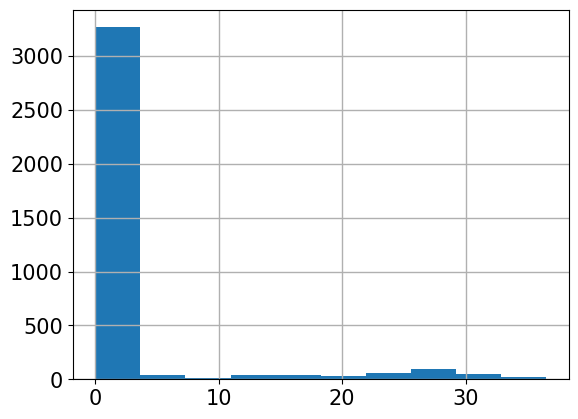

In [87]:
### 2024.09.21. 10PM Code run end
print(np.shape(df_geo_indices[df_geo_indices['tir1'] > 1]))
df_geo_indices['tir1'].hist()

<Axes: >

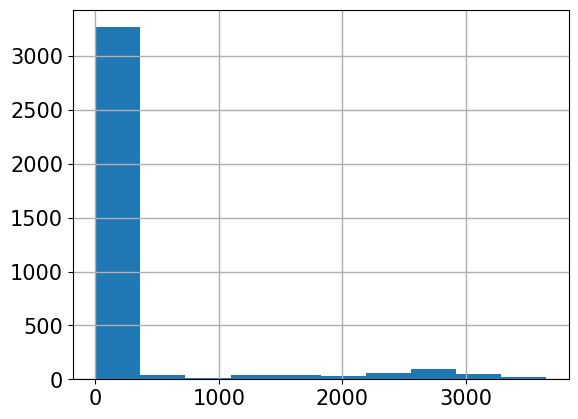

In [88]:
df_geo_indices['tir1'] *= 100
df_geo_indices['tir1'].hist()

(409, 16)


<Axes: >

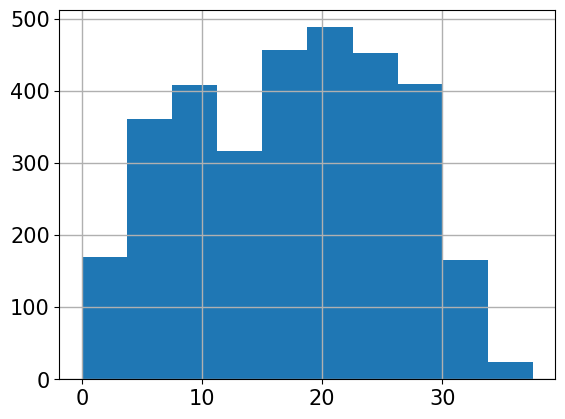

In [89]:
print(np.shape(df_geo_indices[df_geo_indices['tir1'] > 100]))
df_geo_indices.loc[df_geo_indices['tir1'] > 100, 'tir1'] = np.nan
df_geo_indices.loc[df_geo_indices['tir1'] < -100, 'tir1'] = np.nan

df_geo_indices['tir1'].hist()

<Axes: >

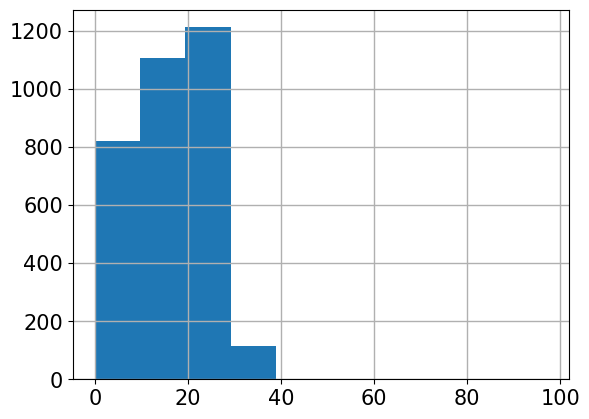

In [90]:
df_geo_indices['tir2'] *= 100

df_geo_indices.loc[df_geo_indices['tir2'] > 100, 'tir2'] = np.nan
df_geo_indices.loc[df_geo_indices['tir2'] < -100, 'tir2'] = np.nan

df_geo_indices['tir2'].hist()

In [91]:
df_geo_indices = df_geo_indices.dropna(axis=0)
print(np.shape(df_geo_indices))

df_geo_indices.to_csv(f'{save_path}/df_geo_indices.csv', sep=',')  # Re-save

(3252, 16)


### Feature importance

In [125]:
df_geo_indices = pd.read_csv(f'/home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2013_2024/df_geo_indices.csv')
print(np.shape(df_geo_indices))

# Extracting only the summer season (June, July, August)
df_geo_indices['dates'] = pd.to_datetime(df_geo_indices['dates'], format='%Y%m%d')
df_geo_indices = df_geo_indices[df_geo_indices['dates'].dt.month.isin([6, 7, 8])]
print(np.shape(df_geo_indices))
df_geo_indices.head()

(3245, 17)
(421, 17)


,Unnamed: 0,latitude,longitude,dates,NDBI,BI,UI,IBI,NDVI,EVI,SAVI,NDWI,MNDWI,tir1,tir2,ave_temperature,max_temperature
11,125,35.12895,126.74505,2013-08-08,-0.265355,-0.196804,-0.515676,0.144209,0.727029,0.481299,0.459604,-0.580017,-0.371901,28.260000,25.500000,29.1,35.4
17,134,35.12925,126.74505,2013-08-08,-0.189160,-0.133084,-0.568989,0.168069,0.692809,0.488178,0.452323,-0.598987,-0.462196,28.210000,25.410000,29.1,35.4
22,142,35.12895,126.74535,2013-08-08,-0.316292,-0.255268,-0.678168,0.092002,0.784277,0.506656,0.484017,-0.601872,-0.352728,27.970000,25.290000,29.1,35.4
28,151,35.12925,126.74535,2013-08-08,-0.188880,-0.134030,-0.610977,0.166124,0.708304,0.491389,0.459519,-0.590250,-0.451732,27.806666,25.170000,29.1,35.4
56,260,35.23005,126.84075,2013-08-08,-0.286071,-0.224853,-0.496611,0.113104,0.698088,0.592569,0.498953,-0.644605,-0.439597,29.700000,26.523334,29.7,36.5


In [127]:
seed = 0
# Standard scaling
scaler_X = StandardScaler()
scaler_y = StandardScaler()

y_related_columns = ['dates', 'latitude', 'longitude', 'ave_temperature', 'max_temperature', 'Unnamed: 0']
X_columns_list = [col for col in df_geo_indices.columns if col not in y_related_columns]
print(X_columns_list)

feature_imp_X = df_geo_indices[X_columns_list].values
feature_imp_y = df_geo_indices['max_temperature'].values

feature_imp_X = scaler_X.fit_transform(feature_imp_X)
feature_imp_y = scaler_y.fit_transform(feature_imp_y.reshape(-1, 1)).flatten()

feature_imp_X_df = pd.DataFrame(data=feature_imp_X, columns=X_columns_list)

feature_imp = hSML.create_feature_importance_df(feature_imp_X_df, feature_imp_y)
feature_imp.to_csv(f'{save_path}/feature_importance.csv', sep=',', index=False)

# Memory delete
#del feature_imp_X_df
del feature_imp_X
del feature_imp_y

feature_imp.head()

['NDBI', 'BI', 'UI', 'IBI', 'NDVI', 'EVI', 'SAVI', 'NDWI', 'MNDWI', 'tir1', 'tir2']


,feature,importance
0,tir1,0.410333
1,tir2,0.173604
2,MNDWI,0.146628
3,NDWI,0.062693
4,SAVI,0.056802


In [128]:
print(feature_imp)
np.shape(feature_imp_X_df)

   feature  importance
0     tir1    0.410333
1     tir2    0.173604
2    MNDWI    0.146628
3     NDWI    0.062693
4     SAVI    0.056802
5       UI    0.034606
6     NDVI    0.034324
7     NDBI    0.023108
8      EVI    0.022429
9       BI    0.017958
10     IBI    0.017515


(421, 11)

In [129]:
feature_imp_list = feature_imp['feature'].head(8).values
#feature_imp_list = ['tir1', 'MNDWI', 'UI', 'SAVI']
#feature_imp_list = feature_imp['feature'].values

print(feature_imp_list)
print(np.shape(df_geo_indices))

predictors = df_geo_indices[feature_imp_list].values
outcome = df_geo_indices['max_temperature'].values

# Standard scaling for predictors & outcome
predictors_scaled = scaler_X.fit_transform(predictors)
outcome_scaled = scaler_y.fit_transform(outcome.reshape(-1, 1)).flatten()
print(np.shape(predictors_scaled), np.shape(outcome_scaled))

X_train, X_test, y_train, y_test = train_test_split(predictors_scaled, outcome_scaled, test_size=0.2, random_state=seed)

['tir1' 'tir2' 'MNDWI' 'NDWI' 'SAVI' 'UI' 'NDVI' 'NDBI']
(421, 17)
(421, 8) (421,)


### LGBM

In [130]:
save_path = f'{cpuserver_data_FP}/HLS/Korea/UHI_project_L30/2013_2024_summer_maxtemp2'
if not os.path.exists(save_path):
    os.makedirs(save_path)

|   iter    |  target   | learni... | max_depth | n_esti... | num_le... |
-------------------------------------------------------------------------
| 1         | -0.3585   | 0.1692    | 9.437     | 200.7     | 90.83     |
| 2         | -0.3632   | 0.1329    | 8.813     | 159.4     | 135.9     |
| 3         | -0.3576   | 0.2627    | 8.295     | 200.1     | 91.03     |
| 4         | -0.3817   | 0.02099   | 3.409     | 197.5     | 91.86     |
| 5         | -0.3834   | 0.3       | 7.667     | 204.0     | 92.83     |
| 6         | -0.3825   | 0.3       | 9.665     | 198.3     | 89.78     |
| 7         | -0.4601   | 0.01      | 8.902     | 200.5     | 92.21     |
| 8         | -0.3708   | 0.2428    | 3.971     | 297.0     | 61.39     |
| 9         | -0.365    | 0.2302    | 10.34     | 203.1     | 146.7     |
| 10        | -0.3557   | 0.09908   | 3.467     | 181.2     | 71.55     |
| 11        | -0.377    | 0.299     | 10.47     | 235.5     | 93.78     |
| 12        | -0.3638   | 0.1829    | 

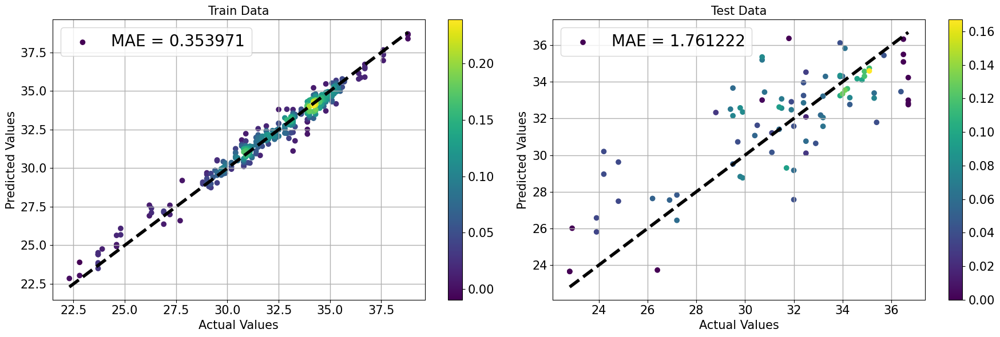

In [131]:
model_name = 'LGBM'

#Light GBM
score, best_params = hSML.Bayesian_optimization_LGBM(X_train, y_train,
                        pbounds = {
                                    'num_leaves': (20, 150),
                                    'max_depth': (3, 12),
                                    'learning_rate': (0.01, 0.3),
                                    'n_estimators': (50, 300)
                                }, n_iter=20)

with open(f'{save_path}/{model_name}_bayesian_best_params.json','w') as f:
    json.dump(best_params, f, ensure_ascii=False, indent=4)

model = lgb.LGBMRegressor(**best_params)
model.fit(X_train, y_train)

# Save the model
joblib.dump(model, f'{save_path}/{model_name}_model.pkl')

# Evaluate the model
relation_square = model.score(X_train, y_train)
print('Relation coefficient: ', relation_square)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse transform the predictions to get them back to the original scale
y_train_original = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_original = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_train_original = scaler_y.inverse_transform(y_pred_train.reshape(-1, 1)).ravel()
y_pred_test_original = scaler_y.inverse_transform(y_pred_test.reshape(-1, 1)).ravel()

# Save pred & true dataframe
df_pred_true_train = pd.DataFrame({'y_true_train':y_train_original,
                                'y_pred_train':y_pred_train_original})
df_pred_true_train.to_csv(f'{save_path}/{model_name}_predtrue_train.csv', sep=',', index=False)

df_pred_true_test = pd.DataFrame({'y_true_test':y_test_original,
                                'y_pred_test':y_pred_test_original})
df_pred_true_test.to_csv(f'{save_path}/{model_name}_predtrue_test.csv', sep=',', index=False)

hPlot.plot_kde_scatter(y_train_original, y_pred_train_original, y_test_original, y_pred_test_original)

### RF

|   iter    |  target   | max_depth | max_fe... | min_sa... | n_esti... |
-------------------------------------------------------------------------
| 1         | -0.6127   | 55.33     | 0.743     | 30.93     | 277.0     |
| 2         | -0.5978   | 42.94     | 0.6807    | 23.0      | 447.0     |
| 3         | -0.5976   | 44.17     | 0.7018    | 23.3      | 447.3     |
| 4         | -0.7053   | 100.0     | 0.1       | 50.0      | 500.0     |
| 5         | -0.5454   | 66.08     | 0.999     | 13.61     | 387.4     |
| 6         | -0.6188   | 100.0     | 0.999     | 50.0      | 363.6     |
| 7         | -0.5207   | 27.94     | 0.999     | 2.0       | 367.9     |
| 8         | -0.8179   | 1.0       | 0.1       | 49.44     | 361.5     |
| 9         | -0.5221   | 57.36     | 0.999     | 2.0       | 351.7     |
| 10        | -0.6179   | 100.0     | 0.1       | 2.0       | 318.0     |
| 11        | -0.53     | 41.38     | 0.961     | 5.617     | 167.0     |
| 12        | -0.5485   | 51.15     | 

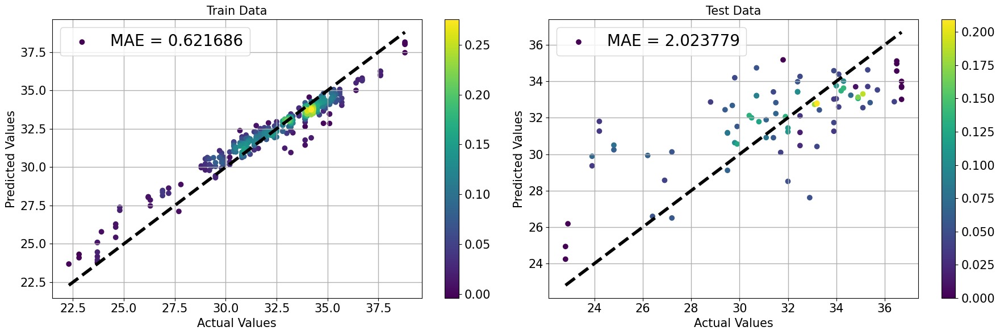

In [132]:
model_name = 'RF'
warnings.filterwarnings("ignore", message="The number of bins", category=UserWarning)
warnings.filterwarnings("ignore", message="To use pickling first train using float32 data to fit the estimator", category=UserWarning)

score, best_params = hSML.Bayesian_optimization_RF(X_train, y_train,
                        pbounds={
                                'n_estimators': (10, 500),
                                'max_features': (0.1, 0.999),
                                'max_depth': (1, 100),
                                'min_samples_split': (2, 50)
                            }, n_iter=20, library_model='RF_cuml')

with open(f'{save_path}/{model_name}_bayesian_best_params.json','w') as f:
    json.dump(best_params, f, ensure_ascii=False, indent=4)

model = cuRF(**best_params, n_streams=1) # For reproducible (n_streams)
model.fit(X_train, y_train)

# Save the model
joblib.dump(model, f'{save_path}/{model_name}_model.pkl')

relation_square = model.score(X_train, y_train)
print('relation coefficient : ', relation_square)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse transform the predictions to get them back to the original scale
y_train_original = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_original = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_train_original = scaler_y.inverse_transform(y_pred_train.reshape(-1, 1)).ravel()
y_pred_test_original = scaler_y.inverse_transform(y_pred_test.reshape(-1, 1)).ravel()

# Save pred & true dataframe
df_pred_true_train = pd.DataFrame({'y_true_train':y_train_original,
                                'y_pred_train':y_pred_train_original})
df_pred_true_train.to_csv(f'{save_path}/{model_name}_predtrue_train.csv', sep=',', index=False)

df_pred_true_test = pd.DataFrame({'y_true_test':y_test_original,
                                'y_pred_test':y_pred_test_original})
df_pred_true_test.to_csv(f'{save_path}/{model_name}_predtrue_test.csv', sep=',', index=False)

hPlot.plot_kde_scatter(y_train_original, y_pred_train_original, y_test_original, y_pred_test_original)

### XGB

|   iter    |  target   | colsam... | max_depth | min_ch... | n_esti... |
-------------------------------------------------------------------------
| 1         | -0.4553   | 0.5934    | 71.8      | 30.93     | 277.0     |
| 2         | -0.496    | 0.4809    | 64.94     | 23.0      | 447.0     |
| 3         | -0.4933   | 0.3172    | 75.43     | 28.05     | 274.5     |


| 4         | -0.3789   | 0.7532    | 20.9      | 13.78     | 99.74     |
| 5         | -0.7496   | 0.1004    | 61.87     | 31.26     | 338.2     |
| 6         | -0.3351   | 0.7277    | 19.61     | 5.639     | 77.64     |
| 7         | -0.4087   | 0.9279    | 93.13     | 25.84     | 349.1     |
| 8         | -0.3351   | 0.7378    | 19.62     | 5.65      | 77.65     |
| 9         | -0.7038   | 0.1       | 2.856     | 24.83     | 75.86     |
| 10        | -0.7279   | 0.1       | 34.21     | 2.0       | 87.9      |
| 11        | -0.3239   | 0.999     | 12.95     | 6.14      | 87.28     |
| 12        | -0.3152   | 0.999     | 7.594     | 5.484     | 101.3     |
| 13        | -0.3651   | 0.999     | 8.106     | 16.14     | 112.9     |
| 14        | -0.7254   | 0.1       | 15.75     | 2.0       | 116.0     |
| 15        | -0.3701   | 0.999     | 6.653     | 16.79     | 99.06     |
| 16        | -0.4946   | 0.999     | 1.0       | 2.0       | 91.6      |
| 17        | -0.4012   | 0.999     | 

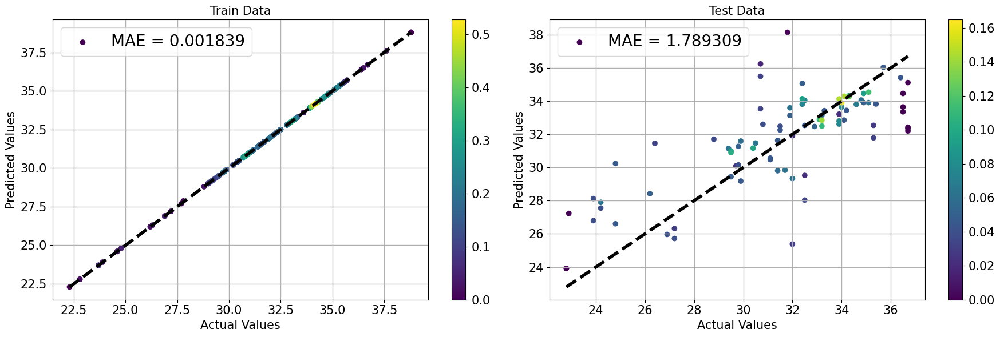

In [133]:
model_name = 'XGB'

# CuPy: CuPy is a GPU array library that is highly compatible with NumPy, making it easy to convert CPU-based NumPy arrays to GPU arrays.
#X_train = cp.array(X_train)
score, best_params = hSML.Bayesian_optimization_XGB(X_train, y_train,
                      pbounds={
                          'n_estimators': (10, 500),
                          'colsample_bytree': (0.1, 0.999),
                          'max_depth': (1, 100),
                          'min_child_weight': (2, 50)
                      }, n_iter=20)

with open(f'{save_path}/{model_name}_bayesian_best_params.json','w') as f:
    json.dump(best_params, f, ensure_ascii=False, indent=4)

model = xgb.XGBRegressor(**best_params)
model.fit(X_train, y_train)

# Save the model
joblib.dump(model, f'{save_path}/{model_name}_model.pkl')

relation_square = model.score(X_train, y_train)
print('relation coefficient : ', relation_square)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse transform the predictions to get them back to the original scale
y_train_original = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_original = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_train_original = scaler_y.inverse_transform(y_pred_train.reshape(-1, 1)).ravel()
y_pred_test_original = scaler_y.inverse_transform(y_pred_test.reshape(-1, 1)).ravel()

# Save pred & true dataframe
df_pred_true_train = pd.DataFrame({'y_true_train':y_train_original,
                                'y_pred_train':y_pred_train_original})
df_pred_true_train.to_csv(f'{save_path}/{model_name}_predtrue_train.csv', sep=',', index=False)

df_pred_true_test = pd.DataFrame({'y_true_test':y_test_original,
                                'y_pred_test':y_pred_test_original})
df_pred_true_test.to_csv(f'{save_path}/{model_name}_predtrue_test.csv', sep=',', index=False)

hPlot.plot_kde_scatter(y_train_original, y_pred_train_original, y_test_original, y_pred_test_original)

### SVM

|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
| 1         | -0.4191   | 54.93     | 4.146     | 0.6067    | 0.5494    |
| 2         | -0.4253   | 42.42     | 3.938     | 0.4432    | 0.8929    |
| 3         | -0.4029   | 52.21     | 3.573     | 0.534     | 0.4801    |
| 4         | -0.412    | 72.69     | 2.603     | 0.253     | 0.1913    |
| 5         | -0.7603   | 0.1471    | 3.845     | 0.6135    | 0.6731    |
| 6         | -0.3254   | 100.0     | 2.0       | 0.01      | 0.01      |
| 7         | -0.6415   | 89.19     | 5.0       | 1.0       | 1.0       |
| 8         | -0.4204   | 28.41     | 2.0       | 1.0       | 0.01      |
| 9         | -0.3604   | 18.96     | 5.0       | 0.01      | 0.01      |
| 10        | -0.4876   | 64.48     | 2.0       | 0.01      | 1.0       |
| 11        | -0.6415   | 13.98     | 2.0       | 1.0       | 1.0       |
| 12        | -0.6415   | 100.0     | 

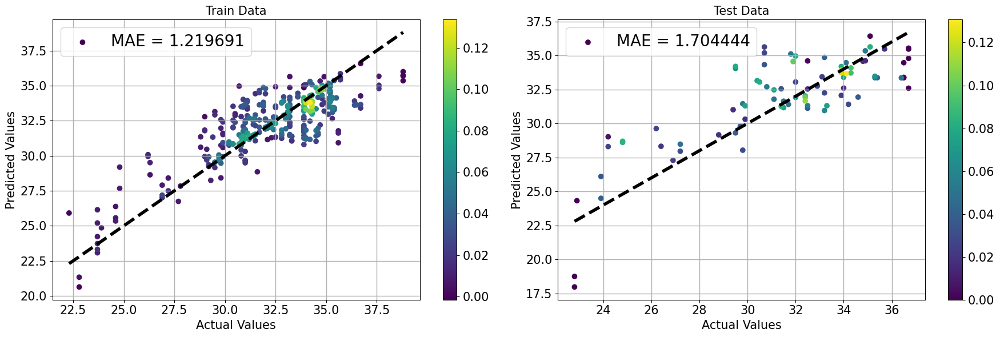

In [134]:
model_name = 'SVM'

score, best_params = hSML.Bayesian_optimization_SVM(X_train, y_train,
                        pbounds = {
                                    'C': (0.1, 100),
                                    'epsilon': (0.01, 1),
                                    'gamma': (0.01, 1),
                                    'degree': (2, 5)  # Only used if kernel is 'poly'
                                }, n_iter=20, library_model='SVM_cuml')

with open(f'{save_path}/{model_name}_bayesian_best_params.json','w') as f:
    json.dump(best_params, f, ensure_ascii=False, indent=4)

model = SVR(**best_params)
model.fit(X_train, y_train)

# Save the model
joblib.dump(model, f'{save_path}/{model_name}_model.pkl')

relation_square = model.score(X_train, y_train)
print('relation coefficient : ', relation_square)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse transform the predictions to get them back to the original scale
y_train_original = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_original = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_train_original = scaler_y.inverse_transform(y_pred_train.reshape(-1, 1)).ravel()
y_pred_test_original = scaler_y.inverse_transform(y_pred_test.reshape(-1, 1)).ravel()

# Save pred & true dataframe
df_pred_true_train = pd.DataFrame({'y_true_train':y_train_original,
                                'y_pred_train':y_pred_train_original})
df_pred_true_train.to_csv(f'{save_path}/{model_name}_predtrue_train.csv', sep=',', index=False)

df_pred_true_test = pd.DataFrame({'y_true_test':y_test_original,
                                'y_pred_test':y_pred_test_original})
df_pred_true_test.to_csv(f'{save_path}/{model_name}_predtrue_test.csv', sep=',', index=False)

hPlot.plot_kde_scatter(y_train_original, y_pred_train_original, y_test_original, y_pred_test_original)

### Reconstruct

In [135]:
for year in range(2013, 2024 + 1):
    need_to_recons = pd.read_csv(f'{cpuserver_data_FP}/HLS/Korea/UHI_project_L30/2013_2024/need_to_recons_{year}.csv')

    # Extracting only the summer season (June, July, August + 5, 9)
    need_to_recons['dates'] = pd.to_datetime(need_to_recons['dates'], format='%Y%m%d')
    need_to_recons = need_to_recons[need_to_recons['dates'].dt.month.isin([5, 6, 7, 8, 9])]

    # Reconvert dates
    need_to_recons['dates'] = pd.to_datetime(need_to_recons['dates'])
    need_to_recons['dates'] = need_to_recons['dates'].dt.strftime('%Y%m%d')

    need_to_recons_geo_indices = make_indices_df(need_to_recons)
    need_to_recons_geo_indices.replace([np.inf, -np.inf], np.nan, inplace=True) # Inf value -> nan

    need_to_recons_geo_indices['tir1'] *= 100
    need_to_recons_geo_indices['tir2'] *= 100
    print(np.shape(need_to_recons_geo_indices[need_to_recons_geo_indices['tir1'] > 100]))
    need_to_recons_geo_indices.loc[need_to_recons_geo_indices['tir1'] > 100, 'tir1'] = np.nan
    need_to_recons_geo_indices.loc[need_to_recons_geo_indices['tir1'] < -100, 'tir1'] = np.nan

    need_to_recons_geo_indices.loc[need_to_recons_geo_indices['tir2'] > 100, 'tir2'] = np.nan
    need_to_recons_geo_indices.loc[need_to_recons_geo_indices['tir2'] < -100, 'tir2'] = np.nan

    need_to_recons_geo_indices = need_to_recons_geo_indices.dropna(axis=0)

    print(need_to_recons_geo_indices.head())
    print(np.shape(need_to_recons_geo_indices))

    # Predictors of need_to_reconstruct
    predictors_2 = need_to_recons_geo_indices[feature_imp_list].values
    predictors_scaled_2 = scaler_X.fit_transform(predictors_2)

    # Best RF model's param
    with open(f'{save_path}/RF_bayesian_best_params.json', 'r') as file:
        best_params_loaded_RF = json.load(file)
    model_loaded_RF = cuRF(**best_params_loaded_RF)
    model_loaded_RF.fit(predictors_scaled, outcome_scaled)
    y_pred_2_RF = model_loaded_RF.predict(predictors_scaled_2)
    y_pred_2_RF_original = scaler_y.inverse_transform(y_pred_2_RF.reshape(-1, 1)).ravel()

    # Best XGB model's param
    with open(f'{save_path}/XGB_bayesian_best_params.json', 'r') as file:
        best_params_loaded_XGB = json.load(file)
    model_loaded_XGB = xgb.XGBRegressor(**best_params_loaded_XGB)
    model_loaded_XGB.fit(predictors_scaled, outcome_scaled)
    y_pred_2_XGB = model_loaded_XGB.predict(predictors_scaled_2)
    y_pred_2_XGB_original = scaler_y.inverse_transform(y_pred_2_XGB.reshape(-1, 1)).ravel()

    # Best SVM model's param
    with open(f'{save_path}/SVM_bayesian_best_params.json', 'r') as file:
        best_params_loaded_SVM = json.load(file)
    model_loaded_SVM = SVR(**best_params_loaded_SVM)
    model_loaded_SVM.fit(predictors_scaled, outcome_scaled)
    y_pred_2_SVM = model_loaded_SVM.predict(predictors_scaled_2)
    y_pred_2_SVM_original = scaler_y.inverse_transform(y_pred_2_SVM.reshape(-1, 1)).ravel()

    # Best LGBM model's param
    with open(f'{save_path}/LGBM_bayesian_best_params.json', 'r') as file:
        best_params_loaded_LGBM = json.load(file)
    model_loaded_LGBM = lgb.LGBMRegressor(**best_params_loaded_LGBM)
    model_loaded_LGBM.fit(predictors_scaled, outcome_scaled)
    y_pred_2_LGBM = model_loaded_LGBM.predict(predictors_scaled_2)
    y_pred_2_LGBM_original = scaler_y.inverse_transform(y_pred_2_LGBM.reshape(-1, 1)).ravel()

    # Reconstruct
    df_recons = pd.DataFrame()
    df_recons['latitude'] = need_to_recons_geo_indices['latitude'].values
    df_recons['longitude'] = need_to_recons_geo_indices['longitude'].values
    df_recons['dates'] = need_to_recons_geo_indices['dates'].values
    df_recons['tir1'] = need_to_recons_geo_indices['tir1'].values
    df_recons['tir2'] = need_to_recons_geo_indices['tir2'].values

    df_recons['RF']   = y_pred_2_RF_original
    df_recons['XGB']  = y_pred_2_XGB_original
    df_recons['SVM']  = y_pred_2_SVM_original
    df_recons['LGBM'] = y_pred_2_LGBM_original

    lat_lon_df = df_recons[['latitude', 'longitude']].copy()
    unique_combinations = lat_lon_df.drop_duplicates()
    unique_combinations_list = list(unique_combinations.itertuples(index=False, name=None))
    
    # =============================================================================
    bound = [126.63, 127.03, 35.04, 35.28] # entire Gwangju
    domain_lon, domain_lat = hGrid.generate_lon_lat_eqdgrid(0.01*0.03, bounds=bound)
    m, n = np.shape(domain_lon)

    # Extract unique latitude, longitude, and date values
    unique_latitudes = np.sort(df_recons['latitude'].unique())
    unique_longitudes = np.sort(df_recons['longitude'].unique())
    unique_dates = np.sort(df_recons['dates'].unique())
    print(unique_dates)

    # Create an empty 3D array (latitudes, longitudes, dates), initialized with NaNs
    lat_len = m #len(unique_latitudes)
    lon_len = n #len(unique_longitudes)
    date_len = len(unique_dates)

    # Vectorized approach: map latitude, longitude, and dates to indices
    lat_idx = np.searchsorted(unique_latitudes, df_recons['latitude'].values)
    lon_idx = np.searchsorted(unique_longitudes, df_recons['longitude'].values)
    date_idx = np.searchsorted(unique_dates, df_recons['dates'].values)

    print(np.shape(lat_idx))
    print(lon_idx)
    print(date_idx)

    data_vars = {}
    var_name_list = ['tir1', 'tir2', 'RF', 'XGB', 'SVM', 'LGBM']

    for var_name in var_name_list:
        # Initialize the 3D array with NaNs
        recons_array = np.full((m, n, date_len), np.nan)
        # Now use the indices to place values in the correct spots in the 3D array
        recons_array[lat_idx, lon_idx, date_idx] = df_recons[var_name].values
        data_vars[var_name] = recons_array

    # To avoid permission error (due to already exist file)
    nc_file_path = f'{save_path}/max_temp_recons_{year}.nc'
    if os.path.exists(nc_file_path):
        os.remove(nc_file_path)
        print(f'File {nc_file_path} has been deleted.')

    domain_lat_ud = np.flipud(domain_lat)
    hData.create_netcdf_file(nc_file=nc_file_path,
                             latitude=domain_lat_ud,
                             longitude=domain_lon,
                             dates=unique_dates,
                             **data_vars)

/tmp/ipykernel_2448102/2058044083.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2448102/2058044083.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2448102/2058044083.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2448102/2058044083.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2448102/2058044083.py:20: RuntimeWarning: invalid value encountered in divide
  NDVI  = (nir - red) / (nir + red)
/tmp/ipykernel_2448102/2058044083.py:27: RuntimeWarning: invalid value encountered in divide
  NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
/tmp/ipykernel_

(0, 14)
   latitude  longitude     dates      NDBI        BI        UI       IBI  \
0  35.27985  126.63015  20130511 -0.344770 -0.281913 -0.621114  0.044604   
1  35.27985  126.63045  20130511 -0.297153 -0.242997 -0.621503  0.057512   
2  35.27985  126.63075  20130511 -0.308045 -0.253455 -0.595763  0.057528   
3  35.27985  126.63105  20130511 -0.355201 -0.292403 -0.592292  0.025895   
4  35.27985  126.63135  20130511 -0.245538 -0.196188 -0.578533  0.097186   

       NDVI       EVI      SAVI      NDWI     MNDWI       tir1   tir2  
0  0.767581  0.474797  0.446824 -0.675385 -0.430967  19.340000  18.72  
1  0.766560  0.480700  0.450055 -0.684491 -0.486239  19.333333  18.71  
2  0.773104  0.511835  0.473902 -0.672886 -0.460239  19.343333  18.72  
3  0.774011  0.521111  0.481265 -0.694549 -0.450485  19.453333  18.87  
4  0.750701  0.469719  0.440188 -0.657227 -0.490909  19.683333  19.04  
(3092740, 14)


/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/cuml/internals/api_decorators.py:344: UserWarning: For reproducible results in Random Forest Classifier or for almost reproducible results in Random Forest Regressor, n_streams=1 is recommended. If n_streams is > 1, results may vary due to stream/thread timing differences, even when random_state is set
  return func(**kwargs)


['20130511' '20130628' '20130730' '20130808' '20130815' '20130831'
 '20130909' '20130916' '20130925']
(3092740,)
[   0    1    2 ... 1321 1326 1331]
[0 0 0 ... 8 8 8]
NetCDF file /home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2013_2024_summer_maxtemp2/max_temp_recons_2013.nc created successfully.


/tmp/ipykernel_2448102/2058044083.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2448102/2058044083.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2448102/2058044083.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2448102/2058044083.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2448102/2058044083.py:20: RuntimeWarning: invalid value encountered in divide
  NDVI  = (nir - red) / (nir + red)
/tmp/ipykernel_2448102/2058044083.py:27: RuntimeWarning: invalid value encountered in divide
  NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
/tmp/ipykernel_

(0, 14)
   latitude  longitude     dates      NDBI        BI        UI       IBI  \
0  35.27955  126.63045  20140507 -0.390887 -0.339487 -0.685316 -0.027055   
1  35.27955  126.63075  20140507 -0.388933 -0.345958 -0.674151 -0.029266   
2  35.27955  126.63105  20140507 -0.411289 -0.361328 -0.640071 -0.023697   
3  35.27955  126.63135  20140507 -0.352482 -0.304050 -0.659611  0.015194   
4  35.27955  126.63165  20140507 -0.362824 -0.318368 -0.669620 -0.012772   

       NDVI       EVI      SAVI      NDWI     MNDWI   tir1       tir2  
0  0.829694  0.597592  0.544346 -0.718943 -0.456283  19.20  18.540000  
1  0.843474  0.649717  0.574040 -0.715417 -0.452350  19.28  18.550000  
2  0.825104  0.632490  0.554589 -0.702461 -0.409476  19.38  18.683334  
3  0.802204  0.590571  0.523660 -0.695271 -0.454068  19.51  18.973333  
4  0.825198  0.657744  0.574091 -0.719153 -0.482129  19.71  19.426666  
(4230491, 14)


/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/cuml/internals/api_decorators.py:344: UserWarning: For reproducible results in Random Forest Classifier or for almost reproducible results in Random Forest Regressor, n_streams=1 is recommended. If n_streams is > 1, results may vary due to stream/thread timing differences, even when random_state is set
  return func(**kwargs)


['20140507' '20140514' '20140523' '20140530' '20140608' '20140615'
 '20140624' '20140701' '20140710' '20140726' '20140802' '20140811'
 '20140827' '20140912' '20140919' '20140928']
(4230491,)
[   1    2    3 ... 1330 1331 1332]
[ 0  0  0 ... 15 15 15]
NetCDF file /home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2013_2024_summer_maxtemp2/max_temp_recons_2014.nc created successfully.


/tmp/ipykernel_2448102/2058044083.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2448102/2058044083.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2448102/2058044083.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2448102/2058044083.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2448102/2058044083.py:20: RuntimeWarning: invalid value encountered in divide
  NDVI  = (nir - red) / (nir + red)
/tmp/ipykernel_2448102/2058044083.py:27: RuntimeWarning: invalid value encountered in divide
  NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
/tmp/ipykernel_

(0, 14)
   latitude  longitude     dates      NDBI        BI        UI       IBI  \
0  35.27985  126.63915  20150501 -0.389761 -0.293420 -0.673466  0.098138   
1  35.27985  126.63945  20150501 -0.307264 -0.209840 -0.666011  0.149563   
2  35.27985  126.63975  20150501 -0.253094 -0.166932 -0.607832  0.162276   
3  35.27985  126.64005  20150501 -0.273989 -0.192217 -0.561823  0.140498   
4  35.27985  126.64035  20150501 -0.247353 -0.148579 -0.528522  0.198739   

       NDVI       EVI      SAVI      NDWI     MNDWI   tir1   tir2  
0  0.724170  0.537863  0.505100 -0.602595 -0.278166  20.60  19.23  
1  0.688649  0.506260  0.490084 -0.583299 -0.336311  20.83  19.46  
2  0.694967  0.511351  0.497806 -0.578883 -0.381715  21.07  19.58  
3  0.715419  0.518789  0.500427 -0.591450 -0.378854  21.24  19.63  
4  0.650732  0.430086  0.431441 -0.554077 -0.355437  21.37  19.68  
(6558206, 14)


/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/cuml/internals/api_decorators.py:344: UserWarning: For reproducible results in Random Forest Classifier or for almost reproducible results in Random Forest Regressor, n_streams=1 is recommended. If n_streams is > 1, results may vary due to stream/thread timing differences, even when random_state is set
  return func(**kwargs)


['20150501' '20150510' '20150517' '20150526' '20150602' '20150618'
 '20150627' '20150704' '20150729' '20150805' '20150814' '20150821'
 '20150830' '20150906' '20150915' '20150922']
(6558206,)
[ 30  31  32 ... 624 749 815]
[ 0  0  0 ... 15 15 15]
NetCDF file /home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2013_2024_summer_maxtemp2/max_temp_recons_2015.nc created successfully.


/tmp/ipykernel_2448102/2058044083.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2448102/2058044083.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2448102/2058044083.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2448102/2058044083.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2448102/2058044083.py:20: RuntimeWarning: invalid value encountered in divide
  NDVI  = (nir - red) / (nir + red)
/tmp/ipykernel_2448102/2058044083.py:27: RuntimeWarning: invalid value encountered in divide
  NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
/tmp/ipykernel_

(0, 14)
       latitude  longitude     dates      NDBI        BI        UI       IBI  \
19480  35.22795  126.98985  20160503 -0.189449 -0.189449 -0.589529 -0.104636   
19614  35.22765  126.98985  20160503 -0.257805 -0.257805 -0.374037 -0.147977   
19748  35.22735  126.98955  20160503 -0.186672 -0.186672 -0.586146 -0.102944   
19883  35.22705  126.98955  20160503 -0.258749 -0.258749 -0.379726 -0.148600   
20018  35.22675  126.98925  20160503 -0.197562 -0.197562 -0.605556 -0.109608   

       NDVI       EVI      SAVI  NDWI  MNDWI      tir1      tir2  
19480   1.0  0.908628  0.799701  -1.0   -1.0  3.528889  3.615555  
19614   1.0  0.454248  0.461283  -1.0   -1.0  1.175556  1.202222  
19748   1.0  0.906948  0.798616  -1.0   -1.0  3.568889  3.575556  
19883   1.0  0.453168  0.460355  -1.0   -1.0  1.191111  1.188889  
20018   1.0  0.908281  0.799477  -1.0   -1.0  3.540000  3.542222  
(5446149, 14)


/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/cuml/internals/api_decorators.py:344: UserWarning: For reproducible results in Random Forest Classifier or for almost reproducible results in Random Forest Regressor, n_streams=1 is recommended. If n_streams is > 1, results may vary due to stream/thread timing differences, even when random_state is set
  return func(**kwargs)


['20160503' '20160512' '20160519' '20160528' '20160613' '20160620'
 '20160629' '20160706' '20160715' '20160722' '20160731' '20160807'
 '20160816' '20160823' '20160901' '20160908' '20160924']
(5446149,)
[1199 1199 1198 ... 1140 1149 1174]
[ 0  0  0 ... 16 16 16]
NetCDF file /home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2013_2024_summer_maxtemp2/max_temp_recons_2016.nc created successfully.


/tmp/ipykernel_2448102/2058044083.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2448102/2058044083.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2448102/2058044083.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2448102/2058044083.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2448102/2058044083.py:20: RuntimeWarning: invalid value encountered in divide
  NDVI  = (nir - red) / (nir + red)
/tmp/ipykernel_2448102/2058044083.py:27: RuntimeWarning: invalid value encountered in divide
  NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
/tmp/ipykernel_

(0, 14)
     latitude  longitude     dates      NDBI        BI        UI       IBI  \
154  35.10795  127.02675  20170506 -0.624472 -0.344244 -0.292862  0.032272   
186  35.10705  127.02645  20170506 -0.628100 -0.322534 -0.299418  0.017954   
234  35.10585  127.02585  20170506 -0.457122 -0.277861 -0.066795 -0.119778   
275  35.10495  127.02555  20170506 -0.462178 -0.299442 -0.064900  0.272437   
334  35.10375  127.02525  20170506 -0.453544 -0.290338 -0.043246  0.359665   

         NDVI       EVI      SAVI      NDWI     MNDWI  tir1  tir2  
154  0.424633  0.459886  0.365838 -0.769623 -0.279463   0.0   0.0  
186  0.416935  0.401161  0.360984 -0.781215 -0.300628   0.0   0.0  
234  0.381249  0.417475  0.280518 -1.000000 -1.000000   0.0   0.0  
275  0.379562  0.497634  0.282723 -0.629180 -0.235478   0.0   0.0  
334  0.322346  0.513572  0.246293 -0.594076 -0.192361   0.0   0.0  
(3149636, 14)


/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/cuml/internals/api_decorators.py:344: UserWarning: For reproducible results in Random Forest Classifier or for almost reproducible results in Random Forest Regressor, n_streams=1 is recommended. If n_streams is > 1, results may vary due to stream/thread timing differences, even when random_state is set
  return func(**kwargs)


['20170506' '20170515' '20170522' '20170531' '20170616' '20170623'
 '20170709' '20170725' '20170803' '20170810' '20170826' '20170904'
 '20170920']
(3149636,)
[1322 1321 1319 ... 1320 1324 1329]
[ 0  0  0 ... 12 12 12]
NetCDF file /home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2013_2024_summer_maxtemp2/max_temp_recons_2017.nc created successfully.


/tmp/ipykernel_2448102/2058044083.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2448102/2058044083.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2448102/2058044083.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2448102/2058044083.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2448102/2058044083.py:20: RuntimeWarning: invalid value encountered in divide
  NDVI  = (nir - red) / (nir + red)
/tmp/ipykernel_2448102/2058044083.py:27: RuntimeWarning: invalid value encountered in divide
  NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
/tmp/ipykernel_

(0, 14)
   latitude  longitude     dates      NDBI        BI        UI       IBI  \
0  35.27985  126.72885  20180509 -0.127038 -0.034829 -0.259605  0.427836   
1  35.27985  126.72915  20180509 -0.156745 -0.061464 -0.274199  0.398312   
2  35.27985  126.73635  20180509 -0.122696 -0.015279 -0.354148  0.418649   
3  35.27985  126.73665  20180509 -0.184026 -0.065544 -0.353800  0.416058   
4  35.27985  126.73695  20180509 -0.189979 -0.092372 -0.395891  0.375072   

       NDVI       EVI      SAVI      NDWI     MNDWI       tir1   tir2  
0  0.403013  0.337656  0.302280 -0.408270 -0.296616  24.960000  22.62  
1  0.440167  0.375075  0.333405 -0.423330 -0.285531  24.996667  22.53  
2  0.427569  0.283955  0.284650 -0.399853 -0.291455  21.543333  20.56  
3  0.435672  0.299549  0.291400 -0.403693 -0.237296  21.696667  20.56  
4  0.473252  0.342980  0.314697 -0.431430 -0.263008  21.810000  20.55  
(4135606, 14)


/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/cuml/internals/api_decorators.py:344: UserWarning: For reproducible results in Random Forest Classifier or for almost reproducible results in Random Forest Regressor, n_streams=1 is recommended. If n_streams is > 1, results may vary due to stream/thread timing differences, even when random_state is set
  return func(**kwargs)


['20180509' '20180525' '20180603' '20180610' '20180705' '20180712'
 '20180721' '20180728' '20180806' '20180813' '20180822' '20180829'
 '20180907' '20180914' '20180923' '20180930']
(4135606,)
[ 329  330  354 ... 1193 1194 1195]
[ 0  0  0 ... 15 15 15]
NetCDF file /home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2013_2024_summer_maxtemp2/max_temp_recons_2018.nc created successfully.


/tmp/ipykernel_2448102/2058044083.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2448102/2058044083.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2448102/2058044083.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2448102/2058044083.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2448102/2058044083.py:20: RuntimeWarning: invalid value encountered in divide
  NDVI  = (nir - red) / (nir + red)
/tmp/ipykernel_2448102/2058044083.py:27: RuntimeWarning: invalid value encountered in divide
  NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
/tmp/ipykernel_

(0, 14)
   latitude  longitude     dates      NDBI        BI        UI       IBI  \
0  35.27955  126.63045  20190505 -0.343362 -0.285125 -0.674115  0.016788   
1  35.27955  126.63075  20190505 -0.314403 -0.260399 -0.625336  0.034649   
2  35.27955  126.63105  20190505 -0.362258 -0.300367 -0.595984  0.019686   
3  35.27955  126.63135  20190505 -0.337923 -0.276471 -0.665389  0.027439   
4  35.27955  126.63165  20190505 -0.344221 -0.284856 -0.665373  0.010879   

       NDVI       EVI      SAVI      NDWI     MNDWI   tir1       tir2  
0  0.803137  0.544235  0.512187 -0.698229 -0.466773  23.09  21.820000  
1  0.803941  0.554595  0.520328 -0.687113 -0.475414  23.10  21.833333  
2  0.797047  0.548708  0.512743 -0.684952 -0.429189  23.14  21.930000  
3  0.789749  0.543193  0.509736 -0.693014 -0.463678  23.24  22.080000  
4  0.801777  0.586470  0.543791 -0.708356 -0.481552  23.48  22.310000  
(4824416, 14)


/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/cuml/internals/api_decorators.py:344: UserWarning: For reproducible results in Random Forest Classifier or for almost reproducible results in Random Forest Regressor, n_streams=1 is recommended. If n_streams is > 1, results may vary due to stream/thread timing differences, even when random_state is set
  return func(**kwargs)


['20190505' '20190512' '20190521' '20190528' '20190613' '20190622'
 '20190708' '20190715' '20190731' '20190809' '20190816' '20190825'
 '20190901' '20190910' '20190917' '20190926']
(4824416,)
[  1   2   3 ... 762 777 782]
[ 0  0  0 ... 15 15 15]
NetCDF file /home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2013_2024_summer_maxtemp2/max_temp_recons_2019.nc created successfully.


/tmp/ipykernel_2448102/2058044083.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2448102/2058044083.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2448102/2058044083.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2448102/2058044083.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2448102/2058044083.py:20: RuntimeWarning: invalid value encountered in divide
  NDVI  = (nir - red) / (nir + red)
/tmp/ipykernel_2448102/2058044083.py:27: RuntimeWarning: invalid value encountered in divide
  NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
/tmp/ipykernel_

(0, 14)
   latitude  longitude     dates      NDBI        BI        UI       IBI  \
0  35.27955  126.90645  20200507 -0.213925 -0.110214 -0.399331  0.230572   
1  35.27955  126.90675  20200507 -0.220294 -0.127146 -0.405507  0.214542   
2  35.27955  126.90705  20200507 -0.185576 -0.088939 -0.373950  0.304528   
3  35.27955  126.90735  20200507 -0.172921 -0.070648 -0.346262  0.342267   
4  35.27955  126.90765  20200507 -0.253167 -0.173947 -0.404159  0.181292   

       NDVI       EVI      SAVI      NDWI     MNDWI       tir1       tir2  
0  0.575769  0.455779  0.437537 -0.571382 -0.407235  24.710000  22.706667  
1  0.599088  0.479685  0.447903 -0.577603 -0.409402  24.700000  23.200000  
2  0.528015  0.404737  0.379711 -0.494689 -0.340359  24.606666  23.380000  
3  0.486397  0.376338  0.354173 -0.470703 -0.324167  24.316667  23.416667  
4  0.622814  0.561743  0.478163 -0.602637 -0.412387  23.936667  23.140000  
(3416654, 14)


/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/cuml/internals/api_decorators.py:344: UserWarning: For reproducible results in Random Forest Classifier or for almost reproducible results in Random Forest Regressor, n_streams=1 is recommended. If n_streams is > 1, results may vary due to stream/thread timing differences, even when random_state is set
  return func(**kwargs)


['20200507' '20200514' '20200523' '20200530' '20200608' '20200615'
 '20200701' '20200710' '20200717' '20200726' '20200811' '20200818'
 '20200827' '20200903' '20200912' '20200919' '20200928']
(3416654,)
[ 921  922  923 ... 1299 1301 1302]
[ 0  0  0 ... 16 16 16]
NetCDF file /home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2013_2024_summer_maxtemp2/max_temp_recons_2020.nc created successfully.


/tmp/ipykernel_2448102/2058044083.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2448102/2058044083.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2448102/2058044083.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2448102/2058044083.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2448102/2058044083.py:20: RuntimeWarning: invalid value encountered in divide
  NDVI  = (nir - red) / (nir + red)
/tmp/ipykernel_2448102/2058044083.py:27: RuntimeWarning: invalid value encountered in divide
  NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
/tmp/ipykernel_

(0, 14)
      latitude  longitude     dates      NDBI        BI        UI       IBI  \
2997  35.26455  126.81495  20210501 -0.188796 -0.069534 -0.277002  0.906440   
3130  35.26395  126.81225  20210501 -0.112567 -0.087354 -0.105423  0.821027   
3673  35.26155  126.81885  20210501 -0.152171 -0.046378 -0.269289  0.863715   
3952  35.26035  126.81945  20210501 -0.162629 -0.061177 -0.235905  0.842634   
5258  35.25495  126.77325  20210501 -0.094015 -0.050821 -0.184238  0.801329   

          NDVI       EVI      SAVI      NDWI     MNDWI      tir1      tir2  
2997  0.134464  0.231387  0.130023 -0.135354  0.054844  1.316667  1.066667  
3130  0.171132  0.530301  0.159452 -0.115829 -0.003304  0.010000  0.290000  
3673  0.136213  0.206440  0.126756 -0.140214  0.012218  2.083333  0.140000  
3952  0.151281  0.246356  0.141458 -0.154583  0.008254  2.358889  0.890000  
5258  0.167314  0.377060  0.160858 -0.126160 -0.032531  0.708000  0.434286  
(2677342, 14)


/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/cuml/internals/api_decorators.py:344: UserWarning: For reproducible results in Random Forest Classifier or for almost reproducible results in Random Forest Regressor, n_streams=1 is recommended. If n_streams is > 1, results may vary due to stream/thread timing differences, even when random_state is set
  return func(**kwargs)


['20210501' '20210602' '20210611' '20210627' '20210713' '20210720'
 '20210729' '20210805' '20210830' '20210915' '20210922']
(2677342,)
[616 607 629 ... 585 586 587]
[ 0  0  0 ... 10 10 10]
NetCDF file /home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2013_2024_summer_maxtemp2/max_temp_recons_2021.nc created successfully.


/tmp/ipykernel_2448102/2058044083.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2448102/2058044083.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2448102/2058044083.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2448102/2058044083.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2448102/2058044083.py:20: RuntimeWarning: invalid value encountered in divide
  NDVI  = (nir - red) / (nir + red)
/tmp/ipykernel_2448102/2058044083.py:27: RuntimeWarning: invalid value encountered in divide
  NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
/tmp/ipykernel_

(0, 14)
   latitude  longitude     dates      NDBI        BI        UI       IBI  \
0  35.27985  126.63015  20220504 -0.444693 -0.374530 -0.717607 -0.059471   
1  35.27985  126.63045  20220504 -0.427621 -0.365136 -0.721511 -0.048790   
2  35.27985  126.63075  20220504 -0.453869 -0.388407 -0.708619 -0.063340   
3  35.27985  126.63105  20220504 -0.491083 -0.419266 -0.706011 -0.093794   
4  35.27985  126.63135  20220504 -0.393493 -0.327743 -0.699102 -0.014325   

       NDVI       EVI      SAVI      NDWI     MNDWI       tir1   tir2  
0  0.823840  0.568561  0.540614 -0.732714 -0.427225  19.640000  19.10  
1  0.836033  0.596483  0.561485 -0.722175 -0.426159  19.656667  19.15  
2  0.837948  0.617315  0.577480 -0.723828 -0.402039  19.706666  19.24  
3  0.832666  0.615591  0.573353 -0.742586 -0.395863  19.763333  19.55  
4  0.807805  0.551288  0.520646 -0.710769 -0.440467  19.870000  19.70  
(7039509, 14)


/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/cuml/internals/api_decorators.py:344: UserWarning: For reproducible results in Random Forest Classifier or for almost reproducible results in Random Forest Regressor, n_streams=1 is recommended. If n_streams is > 1, results may vary due to stream/thread timing differences, even when random_state is set
  return func(**kwargs)


['20220504' '20220505' '20220512' '20220513' '20220520' '20220521'
 '20220528' '20220529' '20220606' '20220613' '20220621' '20220622'
 '20220630' '20220707' '20220708' '20220715' '20220716' '20220723'
 '20220724' '20220801' '20220808' '20220809' '20220816' '20220817'
 '20220824' '20220825' '20220901' '20220902' '20220909' '20220910'
 '20220917' '20220918' '20220925' '20220926']
(7039509,)
[   0    1    2 ... 1317 1321 1327]
[ 0  0  0 ... 33 33 33]
NetCDF file /home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2013_2024_summer_maxtemp2/max_temp_recons_2022.nc created successfully.


/tmp/ipykernel_2448102/2058044083.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2448102/2058044083.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2448102/2058044083.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2448102/2058044083.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2448102/2058044083.py:20: RuntimeWarning: invalid value encountered in divide
  NDVI  = (nir - red) / (nir + red)
/tmp/ipykernel_2448102/2058044083.py:27: RuntimeWarning: invalid value encountered in divide
  NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
/tmp/ipykernel_

(0, 14)
        latitude  longitude     dates      NDBI        BI        UI       IBI  \
606380  35.27955  126.63045  20230508 -0.420411 -0.361061 -0.703137 -0.050128   
606381  35.27955  126.63075  20230508 -0.418667 -0.364034 -0.701073 -0.057524   
606382  35.27955  126.63105  20230508 -0.421203 -0.367033 -0.670945 -0.045929   
606383  35.27955  126.63135  20230508 -0.384652 -0.329636 -0.686570 -0.014661   
606384  35.27955  126.63165  20230508 -0.379356 -0.322162 -0.686624 -0.020694   

            NDVI       EVI      SAVI      NDWI     MNDWI   tir1       tir2  
606380  0.832246  0.607767  0.561647 -0.731519 -0.449278  17.17  16.436666  
606381  0.845058  0.626870  0.577348 -0.736504 -0.459534  17.23  16.480000  
606382  0.837541  0.606774  0.554601 -0.721564 -0.431507  17.30  16.566667  
606383  0.817458  0.586442  0.535654 -0.711411 -0.449861  17.36  16.656667  
606384  0.816351  0.615513  0.560858 -0.725383 -0.477397  17.46  16.816667  
(6864188, 14)


/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/cuml/internals/api_decorators.py:344: UserWarning: For reproducible results in Random Forest Classifier or for almost reproducible results in Random Forest Regressor, n_streams=1 is recommended. If n_streams is > 1, results may vary due to stream/thread timing differences, even when random_state is set
  return func(**kwargs)


['20230508' '20230515' '20230516' '20230523' '20230531' '20230601'
 '20230608' '20230609' '20230616' '20230617' '20230624' '20230625'
 '20230702' '20230703' '20230710' '20230711' '20230718' '20230719'
 '20230726' '20230727' '20230803' '20230804' '20230811' '20230812'
 '20230819' '20230820' '20230827' '20230904' '20230905' '20230912'
 '20230928' '20230929']
(6864188,)
[   1    2    3 ... 1330 1331 1332]
[ 0  0  0 ... 31 31 31]
NetCDF file /home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2013_2024_summer_maxtemp2/max_temp_recons_2023.nc created successfully.


/tmp/ipykernel_2448102/2058044083.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2448102/2058044083.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2448102/2058044083.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2448102/2058044083.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2448102/2058044083.py:20: RuntimeWarning: invalid value encountered in divide
  NDVI  = (nir - red) / (nir + red)
/tmp/ipykernel_2448102/2058044083.py:27: RuntimeWarning: invalid value encountered in divide
  NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
/tmp/ipykernel_

(12419740, 14)
      latitude  longitude     dates      NDBI        BI        UI       IBI  \
572   35.22285  127.02435  20240501 -1.000000 -0.001667 -0.651931 -1.000000   
609   35.22225  127.02405  20240501 -1.000000  0.004032 -0.633675 -1.000000   
750   35.22015  127.02345  20240501 -0.326546 -0.231436 -0.502755  0.152305   
980   35.21715  127.02255  20240501  0.028621 -0.188455 -0.145496  0.350622   
1055  35.21625  127.02225  20240501 -0.492649 -0.096750 -0.594635  0.617212   

          NDVI       EVI      SAVI      NDWI     MNDWI  tir1       tir2  
572   0.001667  0.000882  0.001548 -0.530350  1.000000   0.0  -9.500000  
609  -0.004032 -0.002130 -0.003754 -0.663002  1.000000   0.0 -10.666667  
750  -0.009144  0.022808 -0.009643 -1.000000 -1.000000   0.0   0.000000  
980  -0.010880  0.009191 -0.010503 -1.000000 -1.000000   0.0   0.000000  
1055 -0.008141 -0.009319 -0.007956 -0.660202 -0.248317   0.0  -5.888889  
(949, 14)


/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/cuml/internals/api_decorators.py:344: UserWarning: For reproducible results in Random Forest Classifier or for almost reproducible results in Random Forest Regressor, n_streams=1 is recommended. If n_streams is > 1, results may vary due to stream/thread timing differences, even when random_state is set
  return func(**kwargs)


['20240501' '20240502' '20240509' '20240510' '20240517' '20240518'
 '20240526' '20240602' '20240603' '20240610' '20240618' '20240619'
 '20240626' '20240705' '20240712' '20240713' '20240721' '20240728'
 '20240729' '20240805' '20240806' '20240813' '20240814' '20240822'
 '20240829' '20240830' '20240906' '20240914' '20240915']
(949,)
[457 456 454 451 450 449 448 447 439 435 435 435 434 434 433 432 432 432
 423 423 422 423 422 422 421 422 421 420 420 419 419 419 419 418 417 416
 347 346 345 344 337 337  17 336 336 336  38  41 333 334 447 281 411 406
 408 409 401 282 290 286 288 289 294 296 293 296 293 293 216 303 229 191
 287 287 264  13 434 433 437 434 364 362 341 340 339 334 333 181 182 450
 448 449 447 446 442 397  67 385 381 381 381 335 334 333 332 215 348 349
 350 459 460 461 462 463 464 465 466 467 468 469 470 471 472 473 474 475
 410 409 304 359 320 316 315 305 306 247 248 430 413 366 338 329 324 221
 222 443 422 421 421 421 420 419 419 419 359 358 358 357 355 212 122 123
  22  23  2

[20130512. 20130628. 20130730. 20130808. 20130816. 20130832. 20130908.
 20130916. 20130924.]
(800, 1333, 29)


/tmp/ipykernel_2448102/1625598927.py:7: RuntimeWarning: Mean of empty slice
  target = np.nanmean(nc_data[var_name][:].data, axis=2)


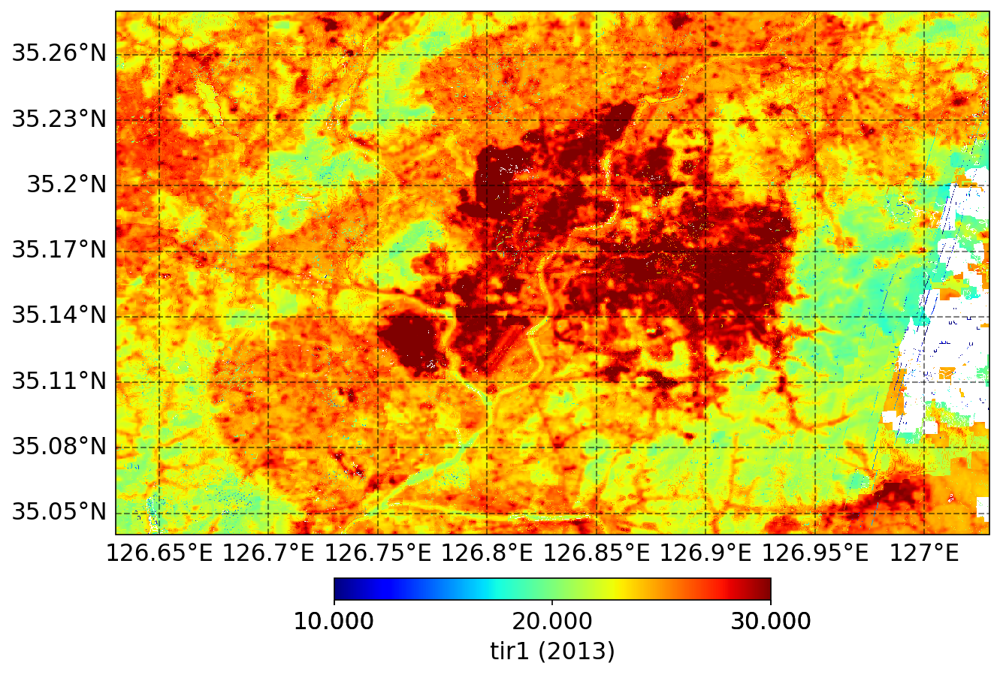

tir1 -100.0 99.333334
[20130512. 20130628. 20130730. 20130808. 20130816. 20130832. 20130908.
 20130916. 20130924.]
(800, 1333, 29)


/tmp/ipykernel_2448102/1625598927.py:7: RuntimeWarning: Mean of empty slice
  target = np.nanmean(nc_data[var_name][:].data, axis=2)


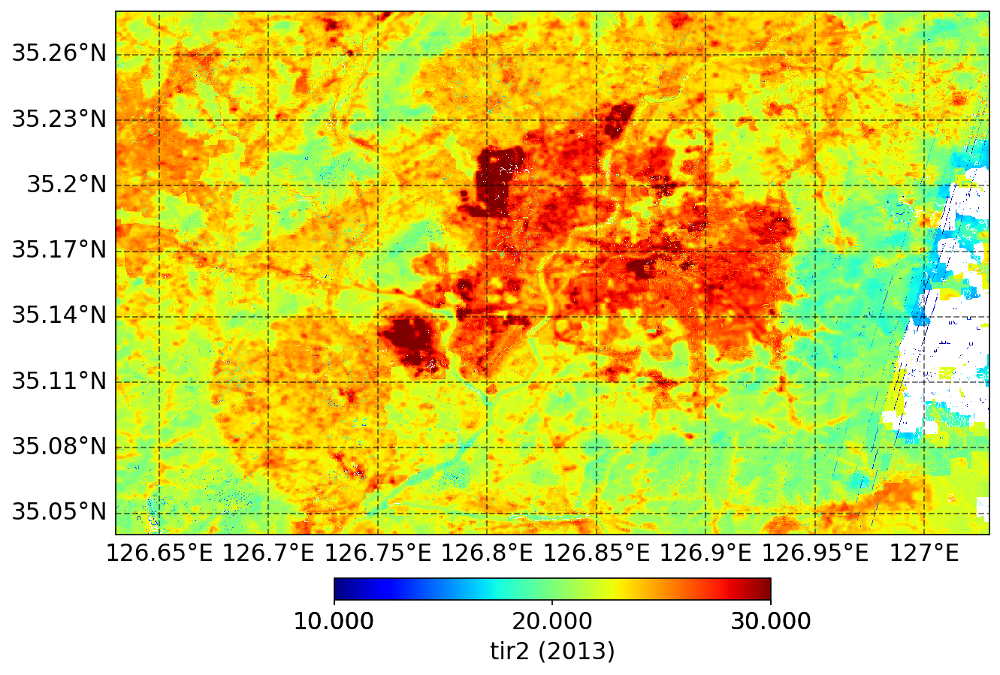

tir2 -98.66667 98.0
[20130512. 20130628. 20130730. 20130808. 20130816. 20130832. 20130908.
 20130916. 20130924.]
(800, 1333, 29)


/tmp/ipykernel_2448102/1625598927.py:7: RuntimeWarning: Mean of empty slice
  target = np.nanmean(nc_data[var_name][:].data, axis=2)


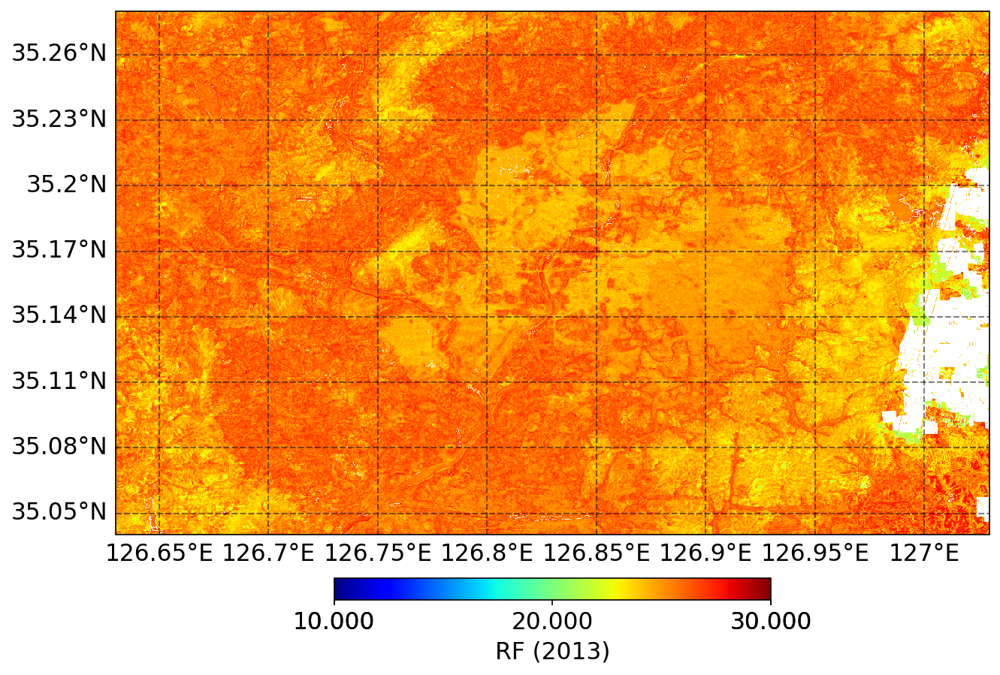

RF 20.394301994301994 27.82678062678063
[20130512. 20130628. 20130730. 20130808. 20130816. 20130832. 20130908.
 20130916. 20130924.]
(800, 1333, 29)


/tmp/ipykernel_2448102/1625598927.py:7: RuntimeWarning: Mean of empty slice
  target = np.nanmean(nc_data[var_name][:].data, axis=2)


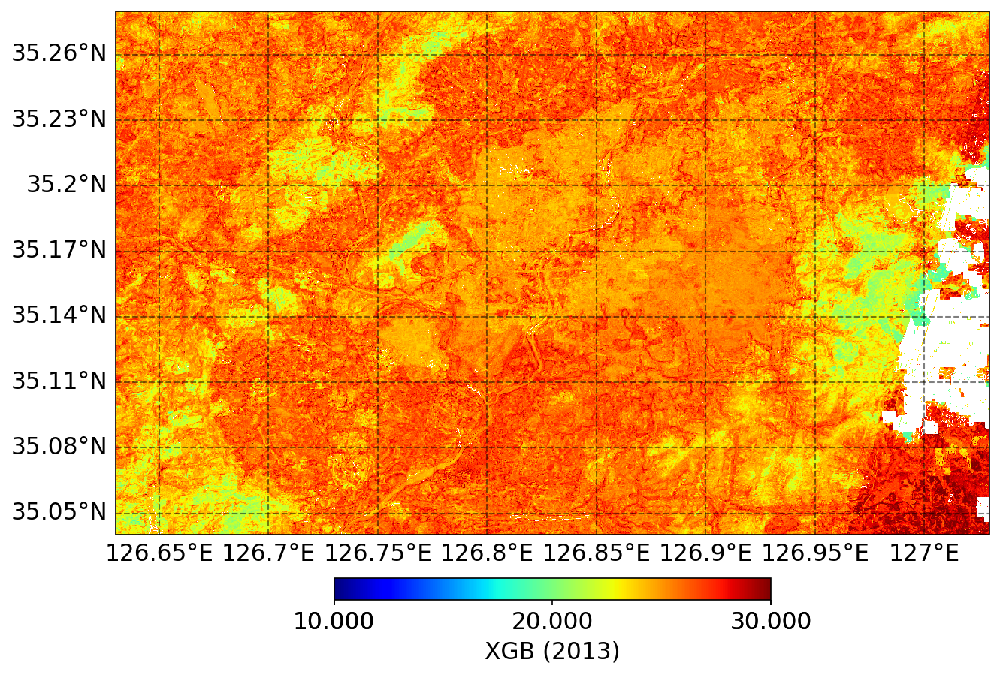

XGB 19.169681549072266 30.20110511779785
[20130512. 20130628. 20130730. 20130808. 20130816. 20130832. 20130908.
 20130916. 20130924.]
(800, 1333, 29)


/tmp/ipykernel_2448102/1625598927.py:7: RuntimeWarning: Mean of empty slice
  target = np.nanmean(nc_data[var_name][:].data, axis=2)


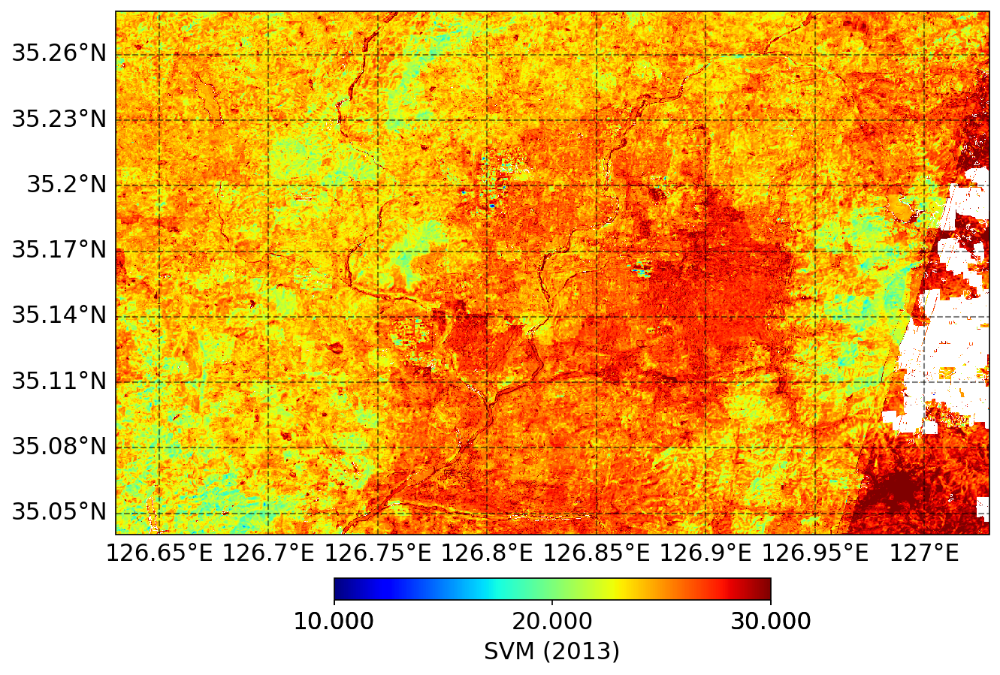

SVM 4.057001849274712 55.468442571218716
[20130512. 20130628. 20130730. 20130808. 20130816. 20130832. 20130908.
 20130916. 20130924.]
(800, 1333, 29)


/tmp/ipykernel_2448102/1625598927.py:7: RuntimeWarning: Mean of empty slice
  target = np.nanmean(nc_data[var_name][:].data, axis=2)


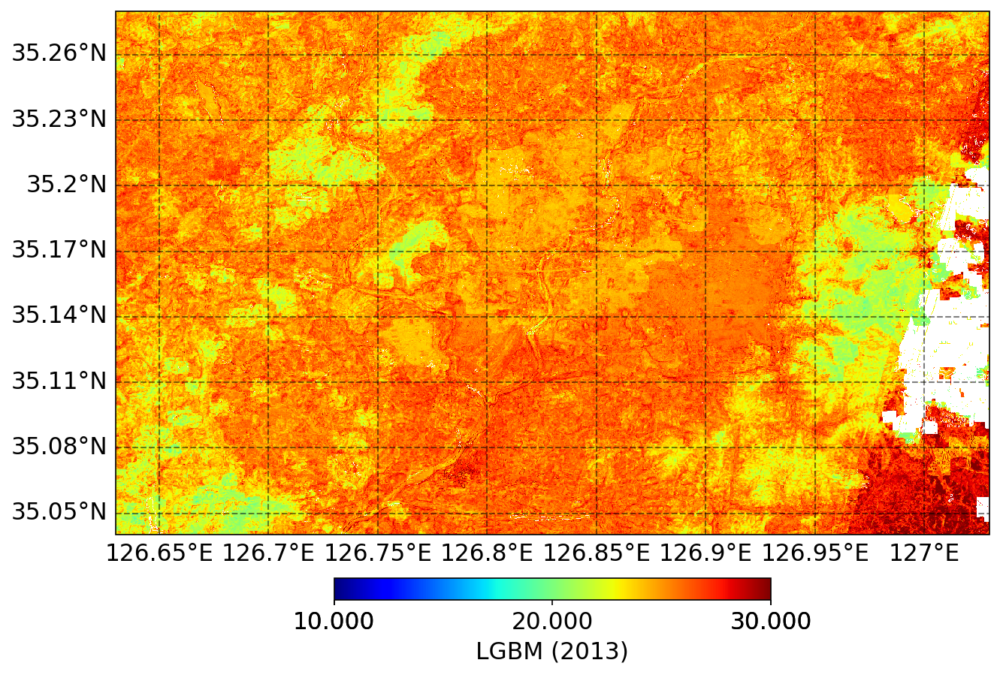

LGBM 18.47114013925154 31.13336541002444


In [102]:
#print('True y', np.nanmin(outcome), np.nanmax(outcome))

year = 2013

for var_name in var_name_list:
    with netCDF4.Dataset(f'{save_path}/ave_temp_recons_{year}.nc') as nc_data:
        target = np.nanmean(nc_data[var_name][:].data, axis=2)
        unique_dates = nc_data['dates'][:].data
    print(unique_dates)
    print(np.shape(data_vars[var_name]))
    hPlot.plot_map(domain_lon, domain_lat_ud, target, 10, 30, label_title=f'{var_name} ({year})', projection='PlateCarree')
    print(var_name, np.nanmin(data_vars[var_name]), np.nanmax(data_vars[var_name]))